# Loading dataset from kaggle

In [1]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! mkdir ~/.kaggle

In [4]:
! cp /content/drive/MyDrive/project/kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
! kaggle competitions download -c dog-breed-identification

100% 688M/691M [00:20<00:00, 41.3MB/s]
100% 691M/691M [00:20<00:00, 34.5MB/s]


In [7]:
! unzip dog-breed-identification.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

In [8]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version" , tf.__version__)
print("TF hub version" , hub.__version__)

#check for gpu
print("GPU" , "Available (YESS!!" if tf.config.list_physical_devices("GPU") else "not available") 

TF version 2.12.0
TF hub version 0.13.0
GPU Available (YESS!!


### getting our data ready

All of our data should be in numbers in tensorflow this is known as tensors. 

In [10]:
# checkout labels for our  data
import pandas as pd
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

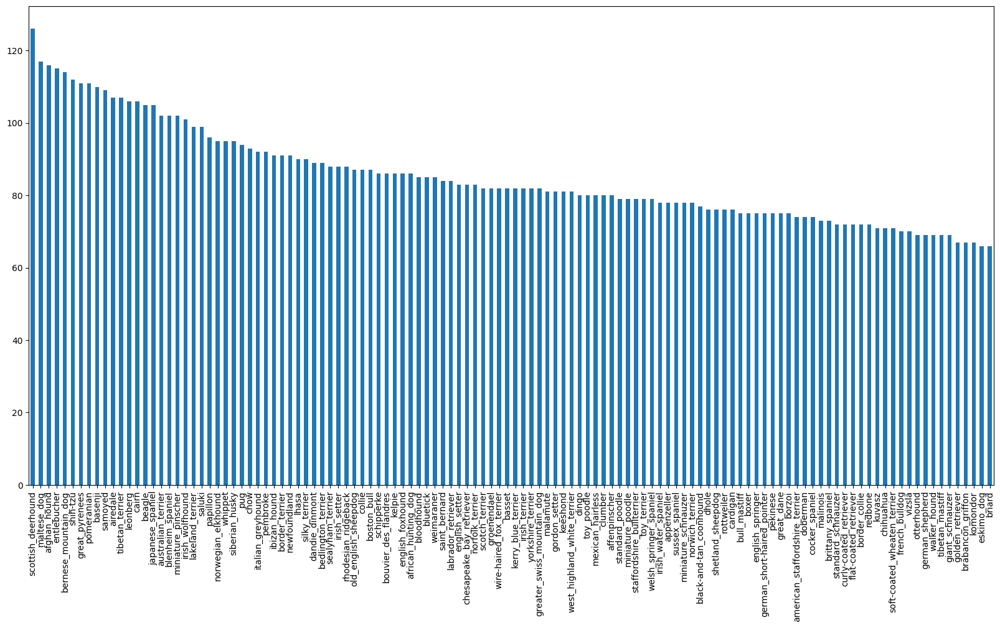

In [12]:
# images of each of breed
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [13]:
labels_csv["breed"].value_counts().median()

82.0

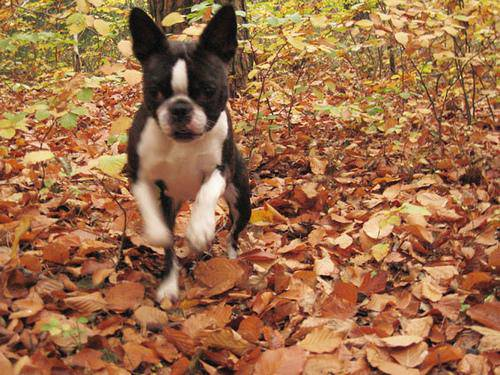

In [14]:
from IPython.display import Image
Image("./train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [15]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [16]:
#creating pathname from image ids
filenames = ["train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
# check  if number of filenames matches number of actual image files

import os
if len(os.listdir("./train")) == len(filenames):
  print("match")
else : 
  print("nope")

match


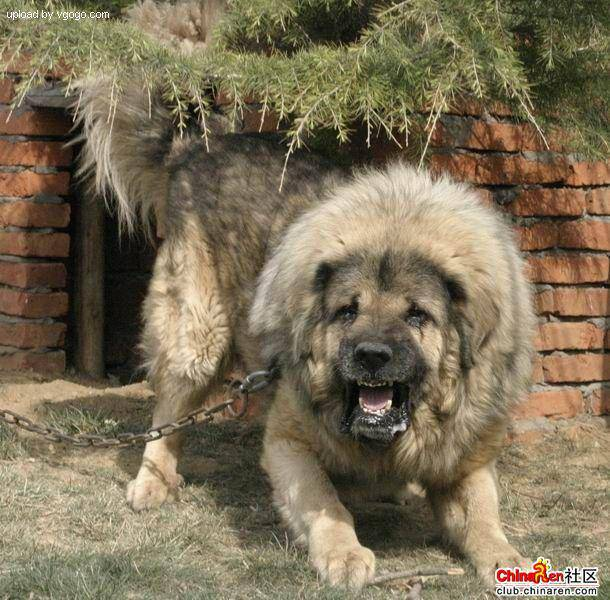

In [18]:
Image(filenames[9000])

In [19]:
labels_csv["breed"][9000]

'tibetan_mastiff'

## Preparing labels

In [20]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
# check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("matches")
else : 
  print("doesn't match")

matches


In [22]:
## converting string into numbers
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [23]:
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [24]:
# turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])[0][0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation set

In [25]:
# setup X and y labels
X = filenames
y = boolean_labels

In [26]:
len(filenames)

10222

We're going to start off with ~1000 images

In [27]:
# set number of images
NUM_IMAGES = 1000 #@param {type : "slider",min:1000 , max:10000 , step : 1000}

In [28]:
# lets split data
from sklearn.model_selection import train_test_split

X_train , X_val , y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size = 0.2,
                                                    random_state = 42)

len(X_train) , len(y_train) , len(X_val) , len(y_val)

(800, 800, 200, 200)

In [29]:
X_train[:2] , y_train[:2]

(['train/00bee065dcec471f26394855c5c2f3de.jpg',
  'train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

# Preprocessing images 

### writing a function
1. Take an image filepath as input
2. Use tensorFlow to read the file and save it to a variable `image` .
3. turn our `image` into Tensors .
4. Resize the `image` to be a shape of (224,224) .
5. Return the modified `image`.

In [30]:
from matplotlib.pyplot import imread
image = imread(filenames[20])
image.shape

(375, 500, 3)

In [31]:
image

array([[[127, 128, 120],
        [123, 124, 116],
        [117, 120, 111],
        ...,
        [ 98, 123,  65],
        [ 97, 122,  64],
        [102, 127,  69]],

       [[117, 120, 111],
        [114, 117, 108],
        [112, 115, 106],
        ...,
        [ 97, 122,  64],
        [ 94, 119,  61],
        [ 98, 123,  65]],

       [[113, 118, 111],
        [111, 116, 109],
        [111, 116, 109],
        ...,
        [ 94, 120,  59],
        [ 90, 116,  55],
        [ 92, 118,  57]],

       ...,

       [[228, 227, 225],
        [233, 229, 228],
        [232, 228, 229],
        ...,
        [219, 214, 211],
        [202, 197, 194],
        [190, 185, 182]],

       [[221, 220, 218],
        [236, 232, 231],
        [242, 238, 239],
        ...,
        [222, 217, 214],
        [220, 215, 212],
        [217, 212, 209]],

       [[239, 238, 236],
        [238, 234, 233],
        [226, 222, 223],
        ...,
        [208, 203, 200],
        [216, 211, 208],
        [215, 210, 207]]

In [32]:
image.max() , image.min()

(255, 0)

In [33]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[127, 128, 120],
        [123, 124, 116],
        [117, 120, 111],
        ...,
        [ 98, 123,  65],
        [ 97, 122,  64],
        [102, 127,  69]],

       [[117, 120, 111],
        [114, 117, 108],
        [112, 115, 106],
        ...,
        [ 97, 122,  64],
        [ 94, 119,  61],
        [ 98, 123,  65]]], dtype=uint8)>

# Main Preprocessing function

In [34]:
# define image size
IMG_SIZE = 224

# create a fnc for preprocessing images
def process_images(image_path):
  """ 
  Takes an image file path and turns the image into a Tensor .
  """

  # Read an image file
  image = tf.io.read_file(image_path)

  #Turn the jpg image into numerical tensor with 3 color channels 
  image = tf.image.decode_jpeg(image,channels=3)

  #Convert  the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image ,size = [IMG_SIZE , IMG_SIZE])

  return image

## Turning our data into batches

Why?

Let's say you're trying to process 10000+ images in one go...they all might not fit into memory.

In order to use TensorFlow effectively we need to convert our data in the form Tensor tuples which look like `image , label`

In [35]:
# To return a tuple
def get_image_label(image_path , label) :
  """
  Takes an image file path name and associated label, process the image and returns a tuple
  """

  image = process_images(image_path)
  return image,label

In [36]:
(process_images(X[42]) , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

turn our data into tuple of tensors

## Creating batches of our data

In [37]:
# define the batch size
BATCH_SIZE = 32

#Create a function ot turn data into batches
def create_data_batches(X , y = None  , batch_size = BATCH_SIZE , valid_data = False , test_data = False):

  # If data is test data , we don;t have labels 
  if test_data : 
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch

  # IF data is a valid dataset
  elif valid_data :
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

    
  else : 
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [38]:
train_data = create_data_batches(X_train , y_train)
val_data = create_data_batches(X_val , y_val , valid_data = True)

Creating training data batches
Creating validation data batches


In [39]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualing data batches

In [40]:
import matplotlib.pyplot as plt

def show_25_images(images , labels):
  # setup the figure
  plt.figure(figsize = (10 ,10))

  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    # crreate subplots
    ax = plt.subplot(5 , 5 , i+1)
    # display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [41]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [42]:
train_images , train_labels = next(train_data.as_numpy_iterator())
train_images , train_labels

(array([[[[4.01790291e-02, 4.99954373e-02, 3.85250486e-02],
          [1.76049754e-01, 1.99579164e-01, 1.60363480e-01],
          [2.43481502e-01, 2.67010897e-01, 2.22718194e-01],
          ...,
          [1.98350415e-01, 2.21879840e-01, 1.77359596e-01],
          [1.88815460e-01, 2.12344885e-01, 1.65286049e-01],
          [2.01736793e-01, 2.25266203e-01, 1.78207383e-01]],
 
         [[3.81338149e-01, 3.99085253e-01, 3.70939016e-01],
          [2.60525763e-01, 2.81579375e-01, 2.43188947e-01],
          [2.50708282e-01, 2.74237692e-01, 2.29945004e-01],
          ...,
          [2.65802234e-01, 2.89331645e-01, 2.46196747e-01],
          [2.57665038e-01, 2.81194448e-01, 2.36183941e-01],
          [2.67878562e-01, 2.91407973e-01, 2.44481772e-01]],
 
         [[4.00124252e-01, 4.11888957e-01, 3.83930266e-01],
          [2.24711835e-01, 2.38761202e-01, 2.02042565e-01],
          [2.04635933e-01, 2.28165343e-01, 1.81563690e-01],
          ...,
          [3.73609990e-01, 3.97139400e-01, 3.5792

In [43]:
unique_breeds[y[0].argmax()] # third line in the function that says  labels[i]

'boston_bull'

In [44]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

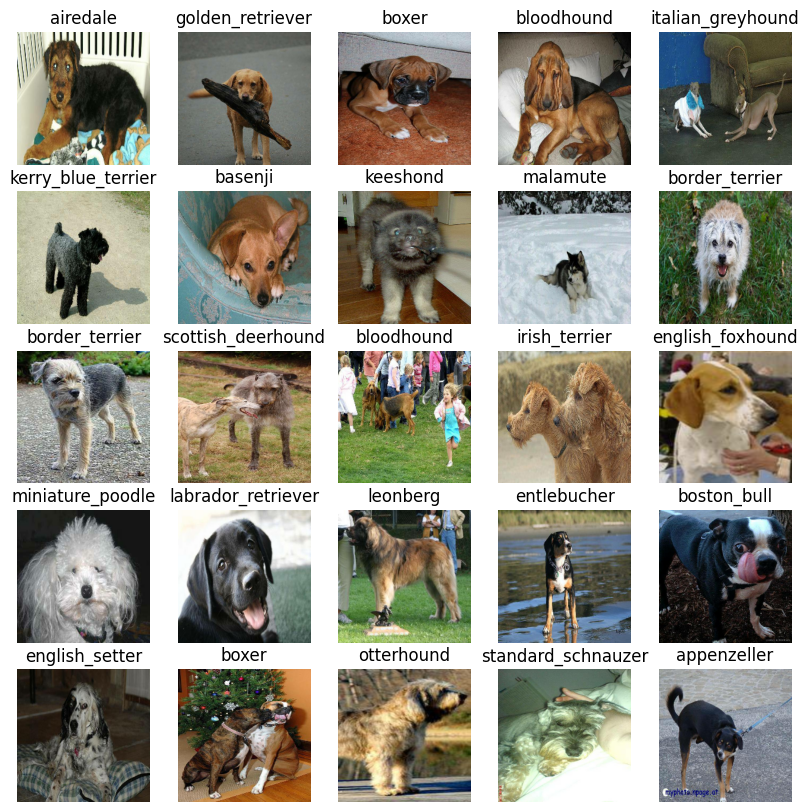

In [45]:
# visualising data
train_images , train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images , train_labels)

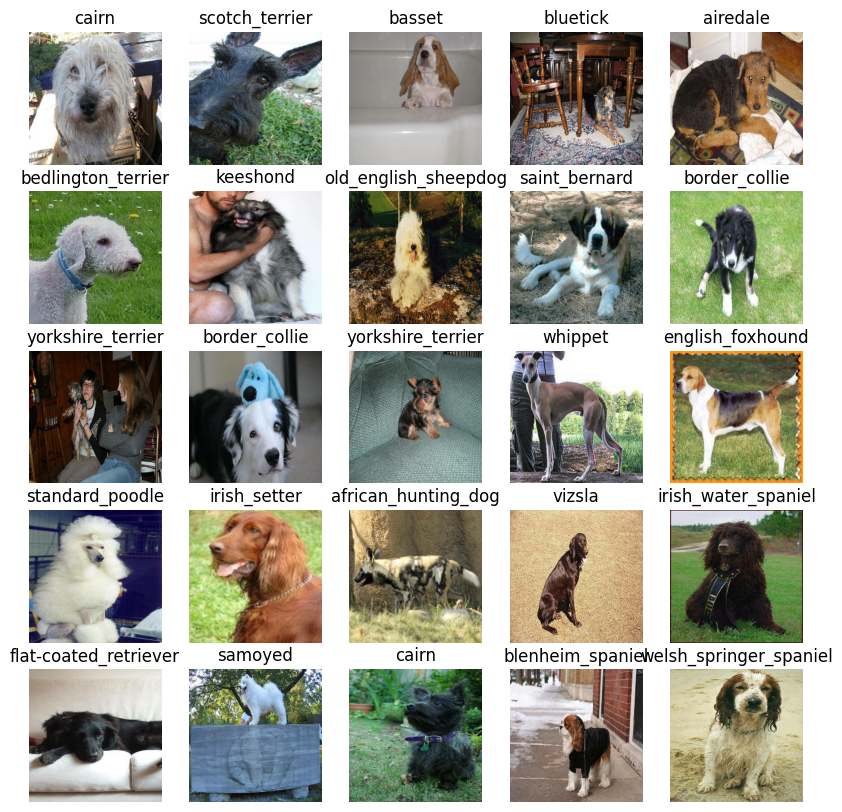

In [46]:
# visalising validation batch
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

## Building a model

we are going to use transfer learning.
before that :
1. the input shape our image shape 
2. the output shpe 
3. the url of the model we want to use from tensorflow hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [47]:
#Setup input shape
INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3]

#Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

#Setup model url
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got out input output and model

now we're going to create a function which :    
1. takes the input, output and the model we've chose as parameters .
2. Defines the layers in a keras model in sequential fashion
3. compiles the model
4. build the model
5. return the model


In [48]:
# create a function that builds a keras model
def create_model(input_shape = INPUT_SHAPE , output_shape = OUTPUT_SHAPE , model_url = MODEL_URL):
  print("Building model with" , MODEL_URL)
  
  #setup the model the layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL) , 
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax")
  ])

  #Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  #build the model
  model.build(INPUT_SHAPE)

  return model


In [49]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [50]:
outputs = np.ones(shape = (1,1,1280)) #this is the shape of outputs in mobilenetv2 architecture after convolution.
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Save a model progress checks its progress or stop its progress

We'll create two callbacks.
1. tensorboard 
2. early stopping call back

### TensorBoard Callback

to setup we need to do three things
1. Load the tensorboard notebook ectension
2. create a tensorboard callback which is able to save logs to a directory and pass it to our mode's `fit()` function .
3. Visualize our model's training logs with `%tensorboard` magic funtion . 

In [51]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [52]:
import datetime

def create_tensorboard_callback():
  #create a log directory storing tensorboard logs
  ! rm -rf ~ /.logs
  ! mkdir ~ /.logs
  logdir = os.path.join("./logs" , 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stooping Callback

To prevent overfitting of the data . 
It stops the training of evalutaion metric stops improving

In [53]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model(a subset of data)

Our firstt model ois only going to train on 1000 images , to make sure everything is working.

In [54]:
NUM_EPOCHS = 100 #@param{type : "slider" , min : 10 , max: 100 , step:10}

In [55]:
# check to make sure the GPU is there
print("GPU" , "available (YES)") if tf.config.list_physical_devices("GPU")else "not available"

GPU available (YES)


function to train a model
* Create a model using `create_model()`
* Setup tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data , validation data , number of epochs to train for (`NUM_EPOCHS`) and the call backs we'd like to use
* return the model

In [56]:
# build a function to train and return a model

def train_model():
  """
  Trains a given model and returns the trained version
  """

  #Create a model
  model = create_model()

  #create new tensorboard
  tensorboard = create_tensorboard_callback()

  #fit the model to the data 
  model.fit(x = train_data , 
            epochs = NUM_EPOCHS, 
            validation_data = val_data, 
            validation_freq = 1,
            callbacks = [tensorboard , early_stopping])
  
  #return the fitted model
  return model

In [57]:
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 18s 233ms/step - loss: 4.7455 - accuracy: 0.0787 - val_loss: 3.4968 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 2s 92ms/step - loss: 1.7224 - accuracy: 0.6625 - val_loss: 2.1663 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5982 - accuracy: 0.9350 - val_loss: 1.6752 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 101ms/step - loss: 0.2621 - accuracy: 0.9862 - val_loss: 1.5025 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 2s 95ms/step - loss: 0.1532 - accuracy: 0.9962 - val_loss: 1.4081 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 2s 94ms/step - loss: 0.1039 - accuracy: 0.9987 - val_loss: 1.3739 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] -

### Checking the Tensorboard logs

Tensorboard magic function will acces the logs directory and visualize its contents .

In [58]:
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

## Making predictions 

In [59]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 129ms/step


array([[1.0081657e-03, 8.4773317e-05, 6.0440862e-04, ..., 4.6867356e-04,
        1.5297612e-05, 3.7130490e-03],
       [4.9914431e-04, 2.3628949e-04, 8.9803403e-03, ..., 5.0307548e-04,
        9.9051185e-04, 5.6347367e-04],
       [1.4655967e-05, 2.8094688e-05, 6.3445727e-06, ..., 3.6622770e-04,
        1.2731935e-04, 6.8197772e-04],
       ...,
       [3.8558126e-05, 2.2795555e-05, 6.8085747e-06, ..., 6.2060069e-05,
        1.7743808e-04, 5.4936259e-05],
       [1.2546066e-02, 8.3405190e-05, 2.0592952e-04, ..., 2.5040764e-04,
        9.5768271e-05, 1.0366572e-02],
       [9.5203432e-04, 7.7289493e-05, 3.2137532e-03, ..., 3.0134069e-03,
        3.3090558e-04, 2.0910126e-04]], dtype=float32)

In [61]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.00816565e-03 8.47733172e-05 6.04408619e-04 3.46738379e-05
 4.71543550e-04 1.91876134e-05 1.29876649e-02 2.09141537e-04
 7.09248823e-04 8.14590952e-04 2.08422556e-04 3.58261459e-04
 2.57832784e-04 4.56624803e-05 9.69504938e-04 4.62590251e-04
 5.73219913e-05 1.17328741e-01 9.86826581e-06 2.14389263e-04
 1.12608308e-03 2.10728977e-04 8.43342496e-05 2.98542692e-03
 4.84815355e-05 4.29987791e-04 3.35971743e-01 2.37455359e-04
 1.77896128e-03 3.20772844e-04 2.77908257e-04 2.07134755e-03
 1.05866487e-03 4.03960403e-05 1.47318511e-04 3.22504342e-02
 2.63925576e-05 9.10703093e-04 7.79139809e-05 1.02526035e-04
 1.59780344e-03 5.08381672e-05 9.55057403e-05 7.49969913e-05
 1.40493685e-05 1.36400238e-04 9.22942036e-06 1.12742616e-03
 7.67429883e-04 9.09103896e-04 2.53295701e-04 3.44406108e-05
 8.31939687e-04 2.11850755e-04 1.87508835e-04 6.97542418e-05
 3.81216261e-04 4.64872038e-03 1.86362886e-03 4.88969013e-02
 1.83373617e-04 5.84945665e-05 1.46466505e-03 4.08679261e-05
 1.08542549e-03 7.155396

In [62]:
unique_breeds[17]

'border_terrier'

**As we can see that the predicted value on max index in irish_wolfhound which is same in index 59 so yeah its working**

In [63]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# unbatch a dataset

images_ = []
labels_ = []

# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0] , labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [66]:
get_pred_label(labels_[0])

'cairn'

In [67]:
get_pred_label(predictions[0])

'cairn'

In [68]:
def unbatchify(data):
  """
  takes a batched dataset and returns separate arrays of images and labels . 
  """
  images = []
  labels = []

  for image , label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get :
* Prediction labels
* Validation labels
* Validation images

We'll plot the predicted labels . 

In [69]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label :
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

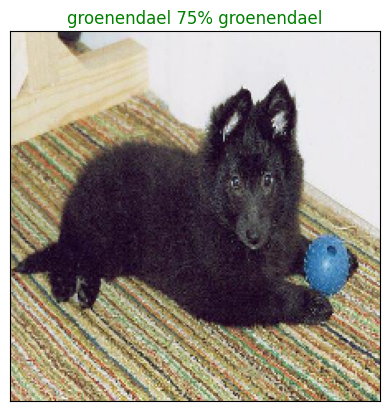

In [70]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [71]:
def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

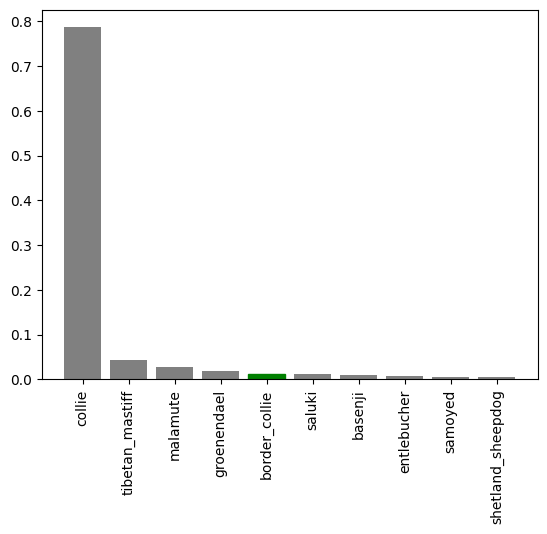

In [72]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

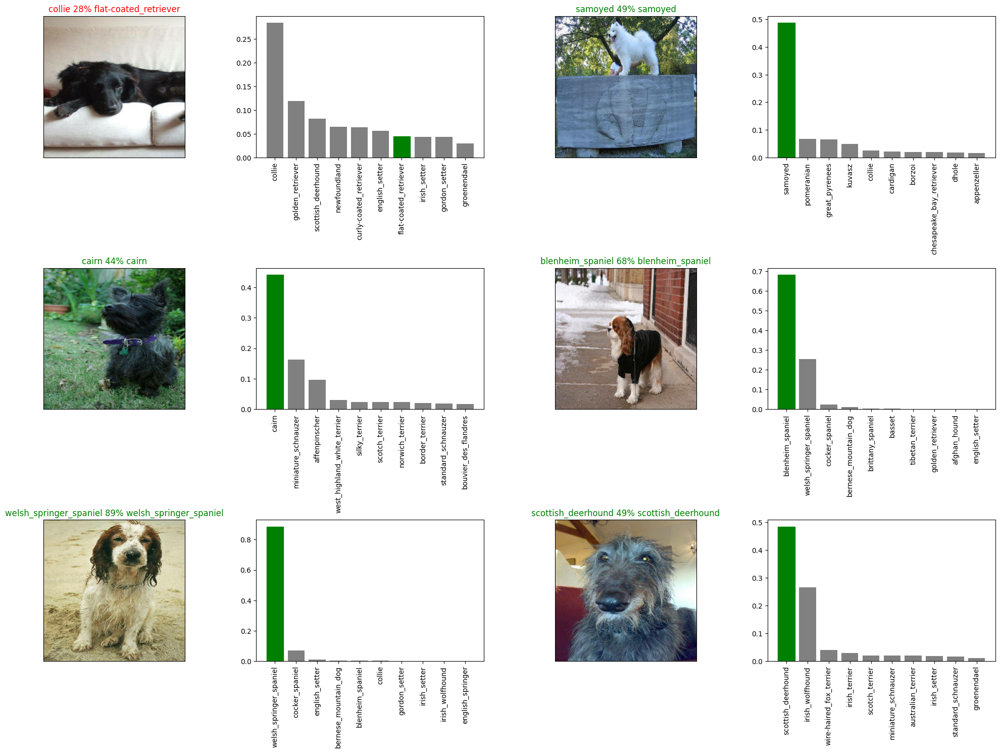

In [73]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [74]:
# Create a function to save a model
def save_model(model, suffix=None):

  # Create a model directory pathname with current time
  modeldir = os.path.join("./content/drive/MyDrive/project",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" 
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [75]:
# Create a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [76]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: ./content/drive/MyDrive/project/20230512-16401683909614-1000-images-mobilenetv2-Adam.h5...


'./content/drive/MyDrive/project/20230512-16401683909614-1000-images-mobilenetv2-Adam.h5'

In [77]:
loaded_1000_image_model = load_model("./content/drive/MyDrive/project/20230512-16401683909614-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: ./content/drive/MyDrive/project/20230512-16401683909614-1000-images-mobilenetv2-Adam.h5


In [78]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 68ms/step - loss: 1.2827 - accuracy: 0.6800


[1.2826610803604126, 0.6800000071525574]

In [79]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 63ms/step - loss: 1.2827 - accuracy: 0.6800


[1.2826610803604126, 0.6800000071525574]

## TRAINING ON COMPLETE DATASET

In [80]:
len(X), len(y)

(10222, 10222)

In [81]:
full_data = create_data_batches(X, y)

Creating training data batches


In [82]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [83]:
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [84]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [85]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 32s 87ms/step - loss: 1.3478 - accuracy: 0.6713
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.4001 - accuracy: 0.8823
Epoch 3/100
320/320 [==============================] - 24s 76ms/step - loss: 0.2348 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 26s 80ms/step - loss: 0.1557 - accuracy: 0.9644
Epoch 5/100
320/320 [==============================] - 26s 81ms/step - loss: 0.1052 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 24s 75ms/step - loss: 0.0769 - accuracy: 0.9881
Epoch 7/100
320/320 [==============================] - 26s 81ms/step - loss: 0.0588 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 25s 79ms/step - loss: 0.0475 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 25s 78ms/step - loss: 0.0377 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 27s 86ms/step - 

In [86]:
save_model(full_model , suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: ./content/drive/MyDrive/project/20230512-16541683910448-full-image-set-mobilenetv2-Adam.h5...


'./content/drive/MyDrive/project/20230512-16541683910448-full-image-set-mobilenetv2-Adam.h5'

In [88]:
loaded_full_model = load_model("./content/drive/MyDrive/project/20230512-16541683910448-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: ./content/drive/MyDrive/project/20230512-16541683910448-full-image-set-mobilenetv2-Adam.h5


In [ ]:
loaded_full_model.evaluate(val_data)

7/7 [==============================] - 1s 66ms/step - loss: 0.0053 - accuracy: 1.0000


[0.005329737439751625, 1.0]

In [89]:
# Load test image filenames
test_path = "/content/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/test/e514f86170698394e20f0cd1af968451.jpg',
 '/content/test/994406421dc025fa26b72855ca46a522.jpg',
 '/content/test/56c76aab35926ffe901a3ef9c78d4a28.jpg',
 '/content/test/591a8fc5d7a9c5a6b25101c4f6a8cbcc.jpg',
 '/content/test/8e3c42260a19524d2656ffedf34a008a.jpg',
 '/content/test/931034049ced098102c7d5d2419fe15e.jpg',
 '/content/test/c2e2f40bb342acd55fdfc8c1ffcffe7f.jpg',
 '/content/test/47cb4401f4a4e243e09259c30c7ae0dc.jpg',
 '/content/test/92ff178991073da2d15474ff216f99ac.jpg',
 '/content/test/ed675fae47e3a3698277131065548e2f.jpg']

In [90]:
len(test_filenames)

10357

In [91]:
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [92]:
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 26s 79ms/step


In [93]:
test_predictions

array([[9.68477742e-09, 7.25099003e-09, 2.04570277e-10, ...,
        2.14015436e-08, 4.19479511e-05, 8.99596952e-10],
       [6.87118973e-06, 2.46122596e-07, 5.58963952e-11, ...,
        5.70649139e-10, 6.81552850e-13, 7.21763664e-12],
       [8.81875803e-06, 7.19025422e-07, 1.57630510e-07, ...,
        7.02108380e-08, 2.13376993e-07, 4.09559604e-08],
       ...,
       [3.37076926e-06, 9.09480324e-10, 1.08486986e-09, ...,
        4.29868940e-09, 1.95317466e-06, 2.81584624e-04],
       [1.68588539e-08, 1.02049775e-11, 5.72254799e-10, ...,
        6.47104457e-07, 2.12785494e-06, 1.67035569e-06],
       [1.33643889e-05, 3.89121997e-05, 2.01211947e-06, ...,
        3.13705839e-09, 1.74452578e-06, 4.77423109e-02]], dtype=float32)

In [94]:
test_predictions.shape

(10357, 120)